# 🌱🍎 Beginner Plant Pathology EDA w/Keras



***Problem Statement:*** Misdiagnosis of the many diseases impacting agricultural crops can lead to misuse of chemicals leading to the emergence of resistant pathogen strains, increased input costs, and more outbreaks with significant economic loss and environmental impacts. Current disease diagnosis based on human scouting is time-consuming and expensive, and although computer-vision based models have the promise to increase efficiency, the great variance in symptoms due to age of infected tissues, genetic variations, and light conditions within trees decreases the accuracy of detection.
Specific Objectives

Objectives of ‘Plant Pathology Challenge’ are to train a model using images of training dataset to 1) Accurately classify a given image from testing dataset into different diseased category or a healthy leaf; 2) Accurately distinguish between many diseases, sometimes more than one on a single leaf; 3) Deal with rare classes and novel symptoms; 4) Address depth perception—angle, light, shade, physiological age of the leaf; and 5) Incorporate expert knowledge in identification, annotation, quantification, and guiding computer vision to search for relevant features during learning.

Please upvote and share ❤️

Books: 
* Pandas 1.x Cookbook by Matt Harrison and Theodore Petrou
* Practical Computer Vision: Extract Insightful Information from Images Using TensorFlow, Keras, and OpenCV by Abhinav Dadhich

In [1]:
import re
import gc
import os
import cv2
import glob
import keras
import shutil
import pathlib
import PIL
import numpy as np
import pandas as pd
import seaborn as sb
import networkx as nx
import tensorflow as tf
import matplotlib.pyplot as plt
from shutil import copyfile
import tensorboard
from datetime import datetime
from packaging import version
from tensorflow import keras as ks
from tensorflow.keras import datasets, layers, models
from kaggle_datasets import KaggleDatasets
from sklearn.model_selection import train_test_split
from skimage.io import imread, imshow, imsave, imread_collection
from mpl_toolkits.mplot3d import Axes3D
from keras.preprocessing import image
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten
from keras.layers import Conv2D, MaxPooling2D
from keras.utils import to_categorical
from keras.preprocessing.image import img_to_array, array_to_img
from keras_preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
from tqdm import tqdm

Using TensorFlow backend.


In [2]:
# Show versions
print('TensorFlow Version: {}'.format(tf.__version__))
print('Eager execution: {}'.format(tf.executing_eagerly()))
print('OpenCV Version:{}'.format(cv2.__version__))
print('Keras Version:{}'.format(ks.__version__))
print('Numpy Version:{}'.format(np.__version__))
print('Pandas Version:{}'.format(pd.__version__))

TensorFlow Version: 2.1.0
Eager execution: True
OpenCV Version:4.2.0
Keras Version:2.2.4-tf
Numpy Version:1.18.1
Pandas Version:1.0.3


In [3]:
# Settings
epochs = 10
img_height = 312
img_width = 312
batch_size = 64

In [4]:
# Check if GPU is ready
print(tf.test.is_gpu_available())

True


In [5]:
# Check the number of GPU's that are ready
print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))

Num GPUs Available:  1


In [6]:
# Read in CSV
train=pd.read_csv("../input/plant-pathology-2020-fgvc7/train.csv")
print(train)

        image_id  healthy  multiple_diseases  rust  scab
0        Train_0        0                  0     0     1
1        Train_1        0                  1     0     0
2        Train_2        1                  0     0     0
3        Train_3        0                  0     1     0
4        Train_4        1                  0     0     0
...          ...      ...                ...   ...   ...
1816  Train_1816        0                  0     0     1
1817  Train_1817        1                  0     0     0
1818  Train_1818        1                  0     0     0
1819  Train_1819        0                  0     1     0
1820  Train_1820        0                  0     0     1

[1821 rows x 5 columns]


In [7]:
train.shape

(1821, 5)

In [8]:
train.describe()

,healthy,multiple_diseases,rust,scab
count,1821.000000,1821.000000,1821.000000,1821.000000
mean,0.283361,0.049973,0.341571,0.325096
std,0.450754,0.217948,0.474367,0.468539
min,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000
75%,1.000000,0.000000,1.000000,1.000000
max,1.000000,1.000000,1.000000,1.000000


In [9]:
# Read in CSV
test=pd.read_csv("../input/plant-pathology-2020-fgvc7/test.csv")
print(test)

       image_id
0        Test_0
1        Test_1
2        Test_2
3        Test_3
4        Test_4
...         ...
1816  Test_1816
1817  Test_1817
1818  Test_1818
1819  Test_1819
1820  Test_1820

[1821 rows x 1 columns]


In [10]:
# Read in CSV
sample_submission="../input/plant-pathology-2020-fgvc7/sample_submission.csv"
submission=pd.read_csv(sample_submission)

In [11]:
# Create training folder 
pathto="./Train/"
shutil.os.mkdir(pathto)

In [12]:
# Create testing folder
pathto="./Test/"
shutil.os.mkdir(pathto)

In [13]:
# Split images based on name
for path in glob.iglob(r'../input/plant-pathology-2020-fgvc7/images/*.jpg'):
    match = re.search(r'\bTest_',path)
    if match:
        shutil.copy(path, "./Test")
        print("Sent to test folder -",path)
    else:
        shutil.copy(path, "./Train")
        print("Sent to train folder -",path)

Sent to train folder - ../input/plant-pathology-2020-fgvc7/images/Train_690.jpg
Sent to train folder - ../input/plant-pathology-2020-fgvc7/images/Train_1235.jpg
Sent to test folder - ../input/plant-pathology-2020-fgvc7/images/Test_611.jpg
Sent to train folder - ../input/plant-pathology-2020-fgvc7/images/Train_749.jpg
Sent to test folder - ../input/plant-pathology-2020-fgvc7/images/Test_1810.jpg
Sent to test folder - ../input/plant-pathology-2020-fgvc7/images/Test_1493.jpg
Sent to train folder - ../input/plant-pathology-2020-fgvc7/images/Train_1023.jpg
Sent to train folder - ../input/plant-pathology-2020-fgvc7/images/Train_368.jpg
Sent to test folder - ../input/plant-pathology-2020-fgvc7/images/Test_877.jpg
Sent to train folder - ../input/plant-pathology-2020-fgvc7/images/Train_102.jpg
Sent to train folder - ../input/plant-pathology-2020-fgvc7/images/Train_1516.jpg
Sent to train folder - ../input/plant-pathology-2020-fgvc7/images/Train_28.jpg
Sent to train folder - ../input/plant-pathol

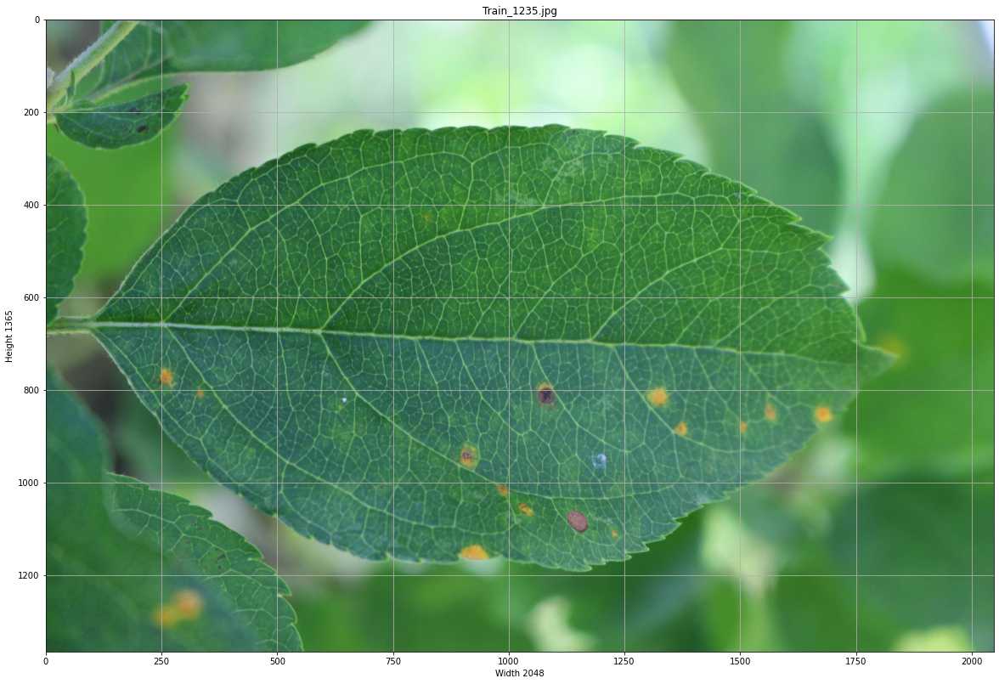

In [14]:
# Grab a sample image
for dirname, _, filenames in os.walk('/kaggle/input/plant-pathology-2020-fgvc7/images/'):
    for filename in filenames[1:2]:
        picture = imread('../input/plant-pathology-2020-fgvc7/images/'+filename)
        plt.figure(figsize=(20, 15))
        plt.title(filename)
        plt.grid()
        plt.ylabel('Height {}'.format(picture.shape[0]))
        plt.xlabel('Width {}'.format(picture.shape[1]))
        plt.imshow(picture);

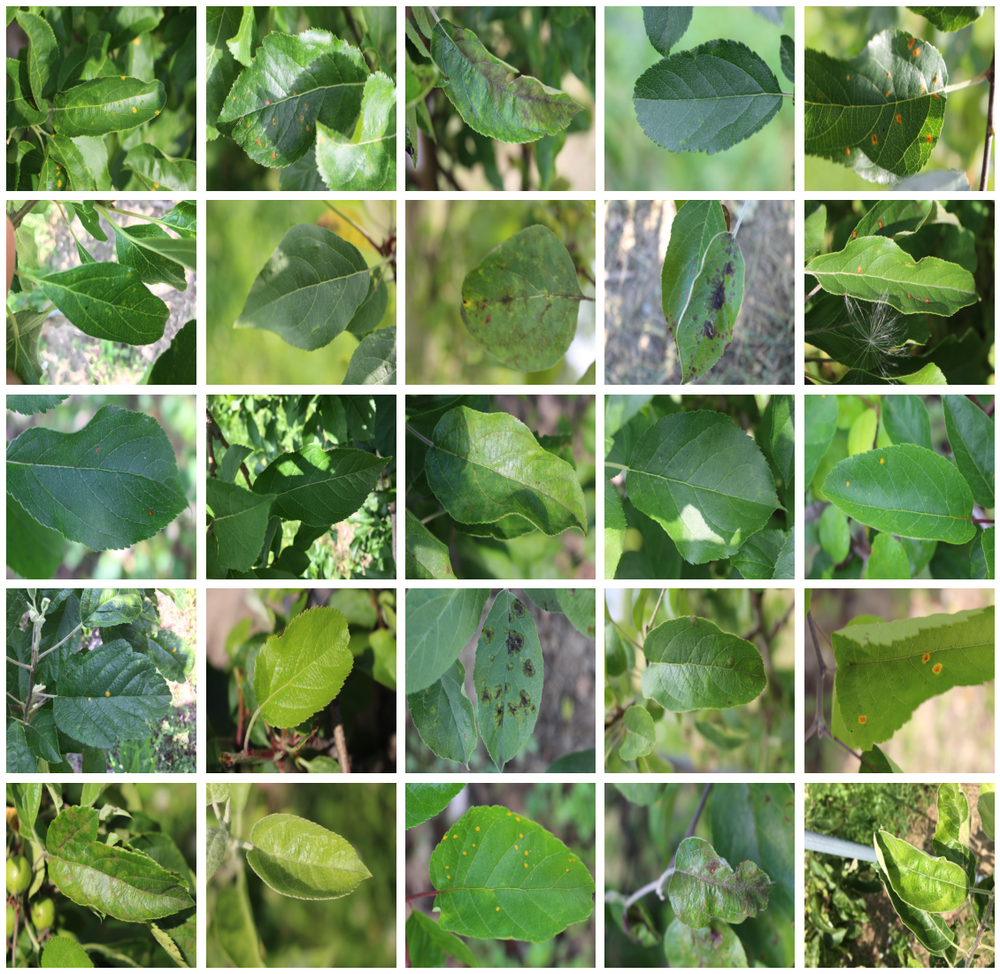

In [15]:
# View all images
col_dir = '../input/plant-pathology-2020-fgvc7/images/*.jpg'
images = imread_collection(col_dir)
fig, axes = plt.subplots(nrows=5, ncols=5, figsize=(20,20))

for i, image in enumerate(images):
    if (i == 25) : break
    row = i // 5
    col = i % 5
    axes[row, col].axis("off")
    axes[row, col].imshow(image, aspect="auto")
plt.subplots_adjust(wspace=.05, hspace=.05)

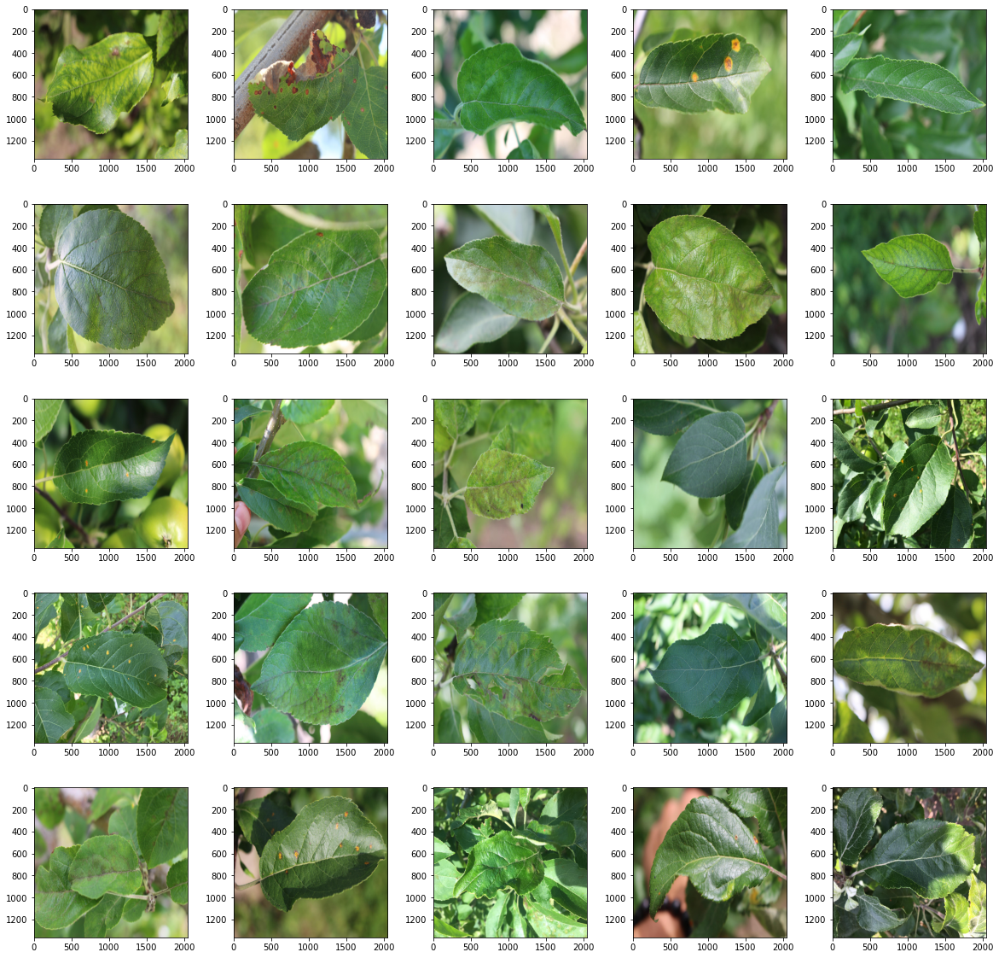

In [16]:
# View all training images
col_dir = './Train/*.jpg'
images = imread_collection(col_dir)
fig, axes = plt.subplots(nrows=5, ncols=5, figsize=(20,20))

for i, image in enumerate(images):
    if (i == 25) : break
    row = i // 5
    col = i % 5
    axes[row, col].imshow(image, aspect="auto")
plt.subplots_adjust(wspace=0.3, hspace=0.3)

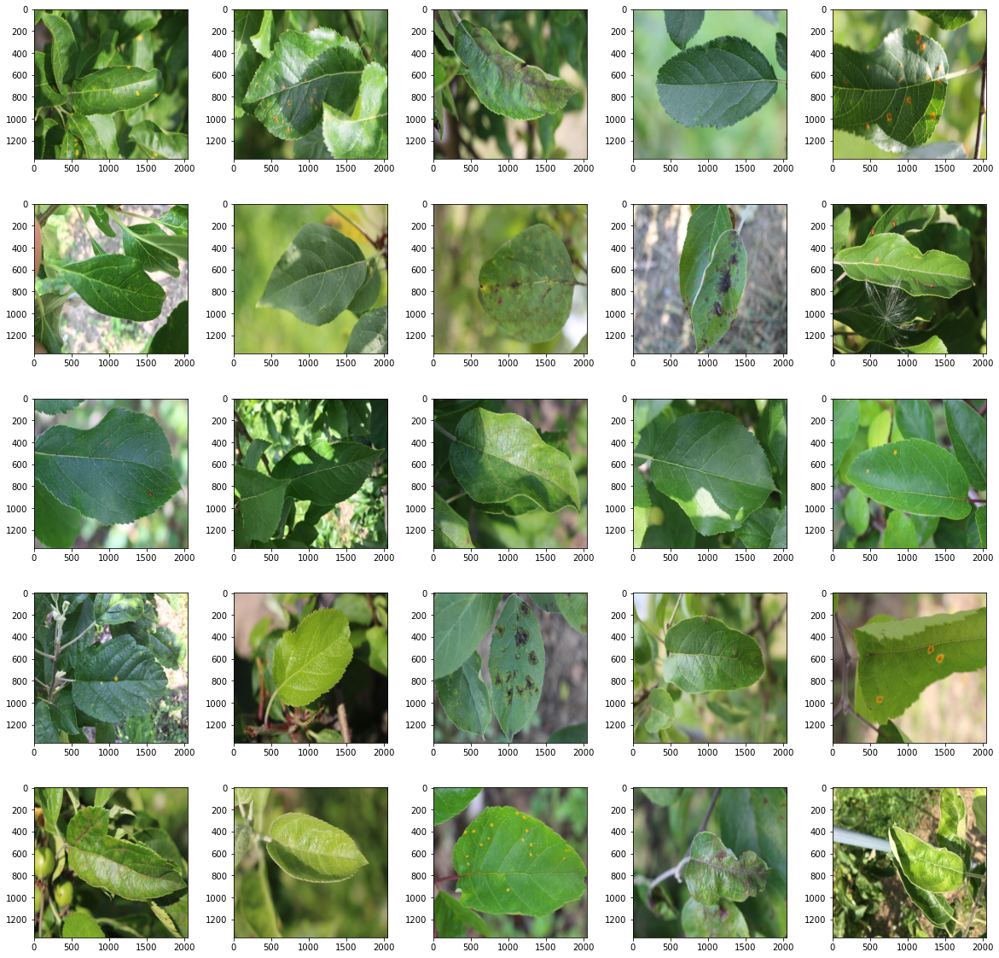

In [17]:
# View all testing images
col_dir = './Test/*.jpg'
images = imread_collection(col_dir)
fig, axes = plt.subplots(nrows=5, ncols=5, figsize=(20,20))

for i, image in enumerate(images):
    if (i == 25) : break
    row = i // 5
    col = i % 5
    axes[row, col].imshow(image, aspect="auto")
plt.subplots_adjust(wspace=0.3, hspace=0.3)

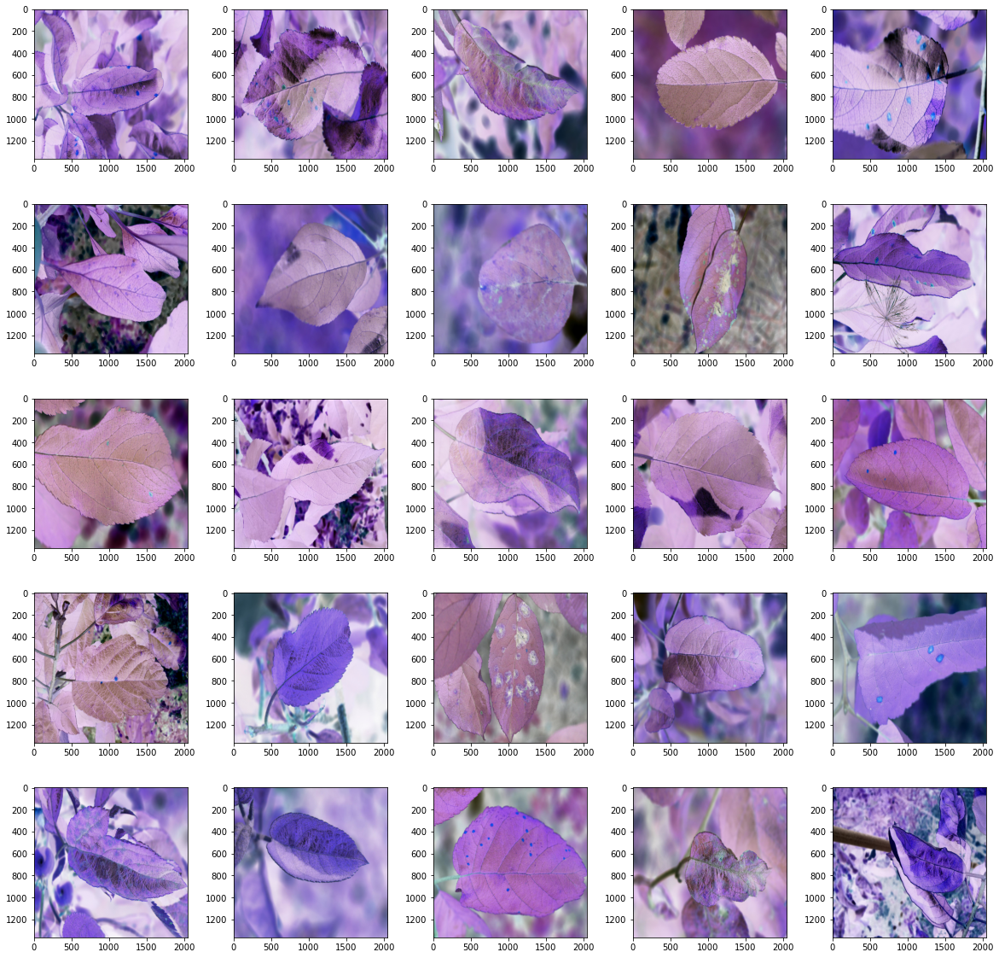

In [18]:
# View all images as negatives
col_dir = '../input/plant-pathology-2020-fgvc7/images/*.jpg'
images = imread_collection(col_dir)
fig, axes = plt.subplots(nrows=5, ncols=5, figsize=(20,20))

for i, image in enumerate(images):
    if (i == 25) : break
    row = i // 5
    col = i % 5
    negative = 255 - image
    axes[row, col].imshow(negative, aspect="auto")
plt.subplots_adjust(wspace=0.3, hspace=0.3)

In [19]:
next(train.iterrows())[1]

image_id             Train_0
healthy                    0
multiple_diseases          0
rust                       0
scab                       1
Name: 0, dtype: object

In [20]:
# Row data in pandas are returned as a series
for index, row in train.head(n=5).iterrows():
    print(index,row)

0 image_id             Train_0
healthy                    0
multiple_diseases          0
rust                       0
scab                       1
Name: 0, dtype: object
1 image_id             Train_1
healthy                    0
multiple_diseases          1
rust                       0
scab                       0
Name: 1, dtype: object
2 image_id             Train_2
healthy                    1
multiple_diseases          0
rust                       0
scab                       0
Name: 2, dtype: object
3 image_id             Train_3
healthy                    0
multiple_diseases          0
rust                       1
scab                       0
Name: 3, dtype: object
4 image_id             Train_4
healthy                    1
multiple_diseases          0
rust                       0
scab                       0
Name: 4, dtype: object


In [21]:
# Row data in pandas are returned as a series
for index2, row2 in test.head(n=5).iterrows():
    print(index2,row2)

0 image_id    Test_0
Name: 0, dtype: object
1 image_id    Test_1
Name: 1, dtype: object
2 image_id    Test_2
Name: 2, dtype: object
3 image_id    Test_3
Name: 3, dtype: object
4 image_id    Test_4
Name: 4, dtype: object


In [22]:
# Append filetype to each image
for i in tqdm(range(train.shape[0])):
    img=(train['image_id'])
add = img.astype(str)+".jpg"
train['image_id'] = add 

100%|██████████| 1821/1821 [00:00<00:00, 207498.92it/s]


In [23]:
image_id=add
image_id.unique()

array(['Train_0.jpg', 'Train_1.jpg', 'Train_2.jpg', ..., 'Train_1818.jpg',
       'Train_1819.jpg', 'Train_1820.jpg'], dtype=object)

In [24]:
# Append filetype to each image
for i in tqdm(range(test.shape[0])):
    img=(test['image_id'][:])
add = img.astype(str)+".jpg"
test['image_id'] = add

100%|██████████| 1821/1821 [00:00<00:00, 12213.18it/s]


In [25]:
image_id=test['image_id']
image_id.unique()

array(['Test_0.jpg', 'Test_1.jpg', 'Test_2.jpg', ..., 'Test_1818.jpg',
       'Test_1819.jpg', 'Test_1820.jpg'], dtype=object)

In [26]:
# Classification labels
column_names=["healthy","multiple_diseases","rust","scab"]

# Assign each image a condition
healthy=(1,0,0,0)
multiple_diseases = (0,1,0,0)
rust=(0,0,1,0)
scab=(0,0,0,1)

# Count the amount of conditions
health_count=0
md_count=0
rust_count=0
scab_count=0

for index, row in train.iterrows():
    condition=index, row['image_id'],row['healthy'],row['multiple_diseases'],row['rust'],row['scab']
    if condition[2:6]==healthy:
        health_count+=1
        print(condition[1]+"- This leaf is healthy:",healthy)
    if condition[2:6]==multiple_diseases:
        md_count+=1
        print(condition[1]+"- This leaf has multiple diseases:",multiple_diseases)
    if condition[2:6]==rust:
        rust_count+=1
        print(condition[1]+"- This leaf has rust:",rust)       
    if condition[2:6]==scab:
        scab_count+=1
        print(condition[1]+"- This leaf has a scab:",scab)

Train_0.jpg- This leaf has a scab: (0, 0, 0, 1)
Train_1.jpg- This leaf has multiple diseases: (0, 1, 0, 0)
Train_2.jpg- This leaf is healthy: (1, 0, 0, 0)
Train_3.jpg- This leaf has rust: (0, 0, 1, 0)
Train_4.jpg- This leaf is healthy: (1, 0, 0, 0)
Train_5.jpg- This leaf is healthy: (1, 0, 0, 0)
Train_6.jpg- This leaf has multiple diseases: (0, 1, 0, 0)
Train_7.jpg- This leaf has a scab: (0, 0, 0, 1)
Train_8.jpg- This leaf has a scab: (0, 0, 0, 1)
Train_9.jpg- This leaf is healthy: (1, 0, 0, 0)
Train_10.jpg- This leaf has rust: (0, 0, 1, 0)
Train_11.jpg- This leaf has a scab: (0, 0, 0, 1)
Train_12.jpg- This leaf has a scab: (0, 0, 0, 1)
Train_13.jpg- This leaf is healthy: (1, 0, 0, 0)
Train_14.jpg- This leaf has rust: (0, 0, 1, 0)
Train_15.jpg- This leaf has rust: (0, 0, 1, 0)
Train_16.jpg- This leaf has a scab: (0, 0, 0, 1)
Train_17.jpg- This leaf has a scab: (0, 0, 0, 1)
Train_18.jpg- This leaf is healthy: (1, 0, 0, 0)
Train_19.jpg- This leaf has a scab: (0, 0, 0, 1)
Train_20.jpg- Th

In [27]:
# Display the amount of conditions for each category
print("The amount of healthy leaves:",health_count)
print("The amount of multiple diseased leaves:",md_count)
print("The amount of rust leaves:",rust_count)
print("The amount of scab leaves:",scab_count)

The amount of healthy leaves: 516
The amount of multiple diseased leaves: 91
The amount of rust leaves: 622
The amount of scab leaves: 592


In [28]:
# Display the total amount
amount = health_count+md_count+rust_count+scab_count
print("Total amount of conditions:",amount)

Total amount of conditions: 1821


In [29]:
# ImageGenerator
# https://keras.io/preprocessing/image/
datagen = ImageDataGenerator(
      rescale=1./255,
      rotation_range=45,
      zca_whitening=False,
      zca_epsilon=1e-06,
      width_shift_range=0.2,
      height_shift_range=0.2,
      brightness_range=(0.1,1.0),
      channel_shift_range=5.0,
      shear_range=0.2,
      validation_split=0.2,
      zoom_range=0.2,
      horizontal_flip=True,
      vertical_flip=True,
      fill_mode='nearest')

test_datagen=ImageDataGenerator(rescale=1./255)

train_image_generator=datagen.flow_from_dataframe(
    dataframe=train[:1460],
    directory='../input/plant-pathology-2020-fgvc7/images/',
    x_col="image_id",
    y_col=column_names,
    batch_size=batch_size,
    seed=42,
    shuffle=True,
    class_mode="raw",
    target_size=(img_height,img_width))

valid_image_generator=test_datagen.flow_from_dataframe(
    dataframe=train[1460:],
    directory='../input/plant-pathology-2020-fgvc7/images/',
    x_col="image_id",
    y_col=column_names,
    batch_size=batch_size,
    seed=42,
    shuffle=True,
    class_mode="raw",
    target_size=(img_height,img_width))

test_image_generator=test_datagen.flow_from_dataframe(
    dataframe=test[:],
    directory='../input/plant-pathology-2020-fgvc7/images/',
    x_col="image_id",
    batch_size=1,
    seed=42,
    shuffle=False,
    class_mode=None,
    target_size=(img_height,img_width))

Found 1460 validated image filenames.
Found 361 validated image filenames.
Found 1821 validated image filenames.


In [30]:
# Apply two dimensional convolutional layer over images that is convolved with the current layer to produce tensor outputs
model=keras.Sequential()
model.add(Conv2D(32, kernel_size=(3, 3),activation='relu',input_shape=(img_height,img_width,3)))
model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.25))
model.add(Flatten())
model.add(Dense(64, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(4, activation='softmax'))

# Compile the model
model.compile(loss='categorical_crossentropy',optimizer='Adam',metrics=['accuracy'])

In [31]:
# Display model
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 310, 310, 32)      896       
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 308, 308, 64)      18496     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 154, 154, 64)      0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 154, 154, 64)      0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 1517824)           0         
_________________________________________________________________
dense_1 (Dense)              (None, 64)                97140800  
_________________________________________________________________
dropout_2 (Dropout)          (None, 64)               

In [32]:
%%time
history=model.fit_generator(generator=train_image_generator,
                            validation_data=valid_image_generator,
                            epochs=epochs)

Epoch 1/10
23/23 [==============================] - 196s 9s/step - loss: 5.5393 - accuracy: 0.3185 - val_loss: 1.6502 - val_accuracy: 0.2964
Epoch 2/10
23/23 [==============================] - 191s 8s/step - loss: 1.3103 - accuracy: 0.3068 - val_loss: 1.3405 - val_accuracy: 0.3435
Epoch 3/10
23/23 [==============================] - 190s 8s/step - loss: 1.2967 - accuracy: 0.3247 - val_loss: 1.2417 - val_accuracy: 0.3435
Epoch 4/10
23/23 [==============================] - 191s 8s/step - loss: 1.2948 - accuracy: 0.3500 - val_loss: 1.2522 - val_accuracy: 0.3435
Epoch 5/10
23/23 [==============================] - 190s 8s/step - loss: 1.2810 - accuracy: 0.3411 - val_loss: 1.2557 - val_accuracy: 0.3435
Epoch 6/10
23/23 [==============================] - 190s 8s/step - loss: 1.2843 - accuracy: 0.3493 - val_loss: 1.3222 - val_accuracy: 0.3435
Epoch 7/10
23/23 [==============================] - 193s 8s/step - loss: 1.2792 - accuracy: 0.3349 - val_loss: 1.4645 - val_accuracy: 0.3435
Epoch 8/10
23

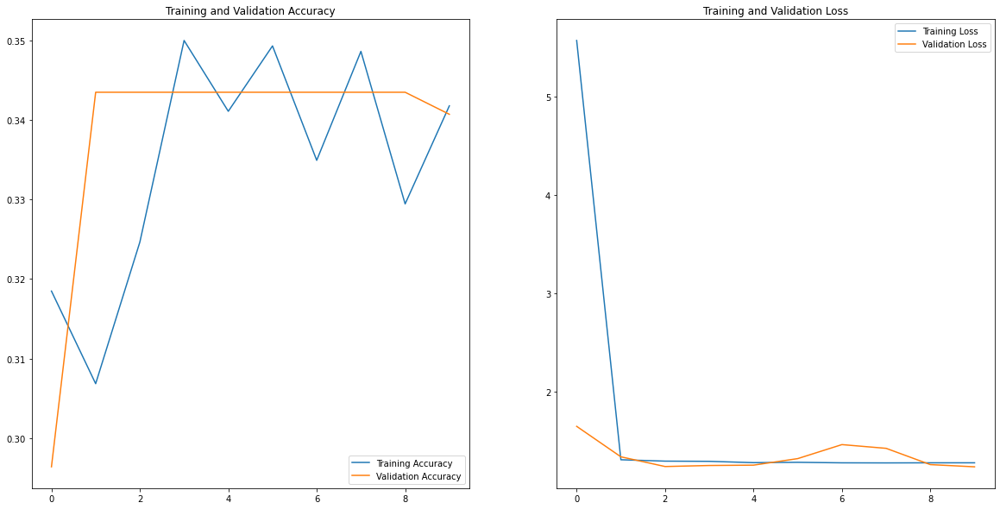

In [33]:
# https://www.tensorflow.org/tutorials/images/classification?hl=da
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss=history.history['loss']
val_loss=history.history['val_loss']

epochs_range = range(epochs)

plt.figure(figsize=(20, 10))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

In [34]:
# Reset CNN
test_image_generator.reset()
prediction=model.predict_generator(test_image_generator,verbose=1)

# Submit Submission
submission.loc[:, 'healthy':] = prediction
submission.to_csv('submission.csv', index=False)
submission.head()

1821/1821 [==============================] - 184s 101ms/step


,image_id,healthy,multiple_diseases,rust,scab
0,Test_0,0.280810,0.082440,0.321367,0.315383
1,Test_1,0.284053,0.067576,0.329124,0.319247
2,Test_2,0.281527,0.079246,0.322995,0.316232
3,Test_3,0.285501,0.060599,0.332912,0.320989
4,Test_4,0.283872,0.068439,0.328660,0.319029
